Importing all libraries which will be used in this project

In [256]:
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from moviepy.editor import VideoFileClip
from collections import deque
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
import time
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC

Visualizing the test images which will be used to test and tune the implementation

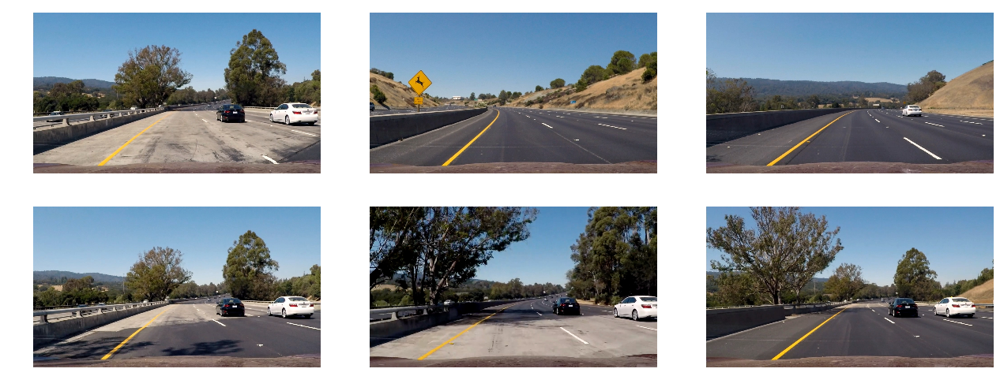

In [206]:
def displayTestImage(ax, idx, fname):
    image_BGR = cv2.imread(fname)
    image_RGB = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2RGB)

    ax[idx].set_axis_off()    
    ax[idx].imshow(image_RGB)

fig, (ax1, ax2) = plt.subplots(2, 3, figsize=(25, 5))
fig.tight_layout()
displayTestImage(ax1, 0, './test_images/test1.jpg')
displayTestImage(ax1, 1, './test_images/test2.jpg')
displayTestImage(ax1, 2, './test_images/test3.jpg')
displayTestImage(ax2, 0, './test_images/test4.jpg')
displayTestImage(ax2, 1, './test_images/test5.jpg')
displayTestImage(ax2, 2, './test_images/test6.jpg')
plt.subplots_adjust(left=0., right=0.5, top=0.9, bottom=0.)
plt.show()

# Color Spaces

Visualizing the difference of values per color channel for RGB

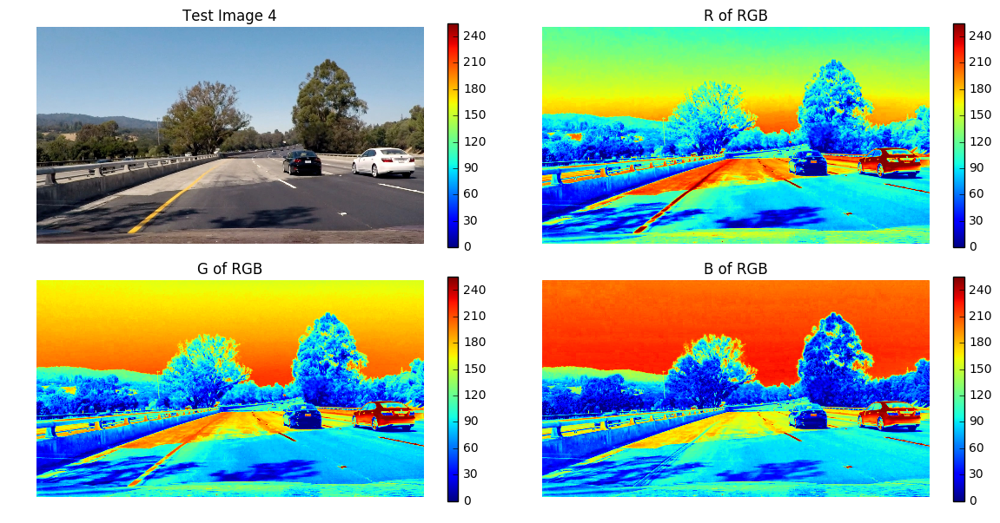

In [237]:
# Different color models

import matplotlib.image as mpimg
def displayTestImage(ax, idx, fname):
    image_BGR = cv2.imread(fname)
    image_RGB = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2RGB)

    ax[idx].set_axis_off()    
    ax[idx].imshow(image_RGB)
    
fig = plt.figure(figsize=(12,6))

plt.subplot(221)
plt.axis('off')
plt.title('Test Image 4')
plt.imshow(mpimg.imread('./test_images/test4.jpg'))
plt.colorbar()
plt.subplot(222)
plt.axis('off')
plt.title('R of RGB')
plt.imshow(mpimg.imread('./test_images/test4.jpg')[:,:,0])
plt.colorbar()
plt.axis('off')
plt.subplot(223)
plt.axis('off')
plt.title('G of RGB')
plt.imshow(mpimg.imread('./test_images/test4.jpg')[:,:,1])
plt.colorbar()
plt.subplot(224)
plt.axis('off')
plt.title('B of RGB')
plt.imshow(mpimg.imread('./test_images/test4.jpg')[:,:,2])
plt.colorbar()
fig.tight_layout()
plt.show()

Visualizing the difference of values per color channel for YCrCb

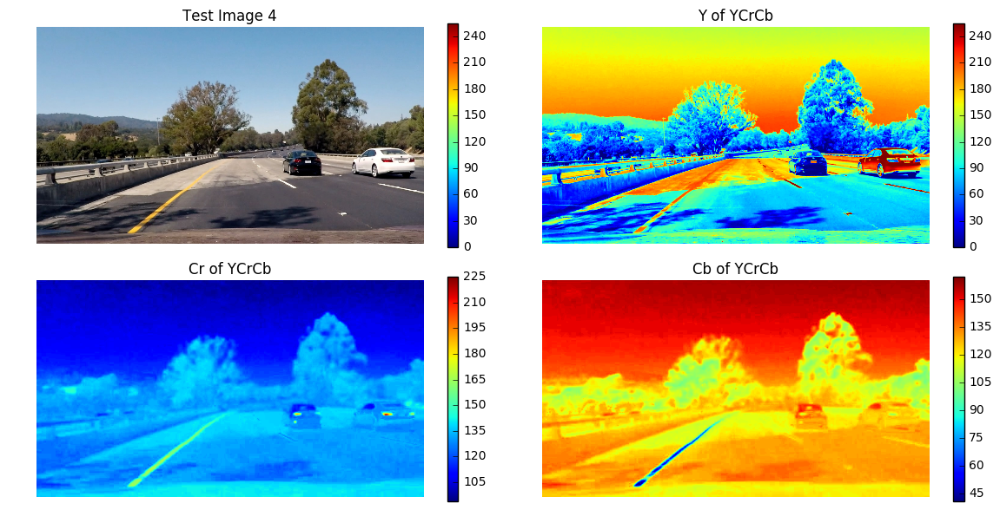

In [239]:
# Different color models

import matplotlib.image as mpimg

image_RGB = mpimg.imread('./test_images/test4.jpg')
image_conv = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2YCrCb)
    
fig = plt.figure(figsize=(12,6))
 
plt.subplot(221)
plt.axis('off')
plt.title('Test Image 4')
plt.imshow(image_RGB)
plt.colorbar()
plt.subplot(222)
plt.axis('off')
plt.title('Y of YCrCb')
plt.imshow(image_conv[:,:,0])
plt.colorbar()
plt.axis('off')
plt.subplot(223)
plt.title('Cr of YCrCb')
plt.axis('off')
plt.imshow(image_conv[:,:,1])
plt.colorbar()
plt.subplot(224)
plt.title('Cb of YCrCb')
plt.axis('off')
plt.imshow(image_conv[:,:,2])
plt.colorbar()
fig.tight_layout()
plt.show()

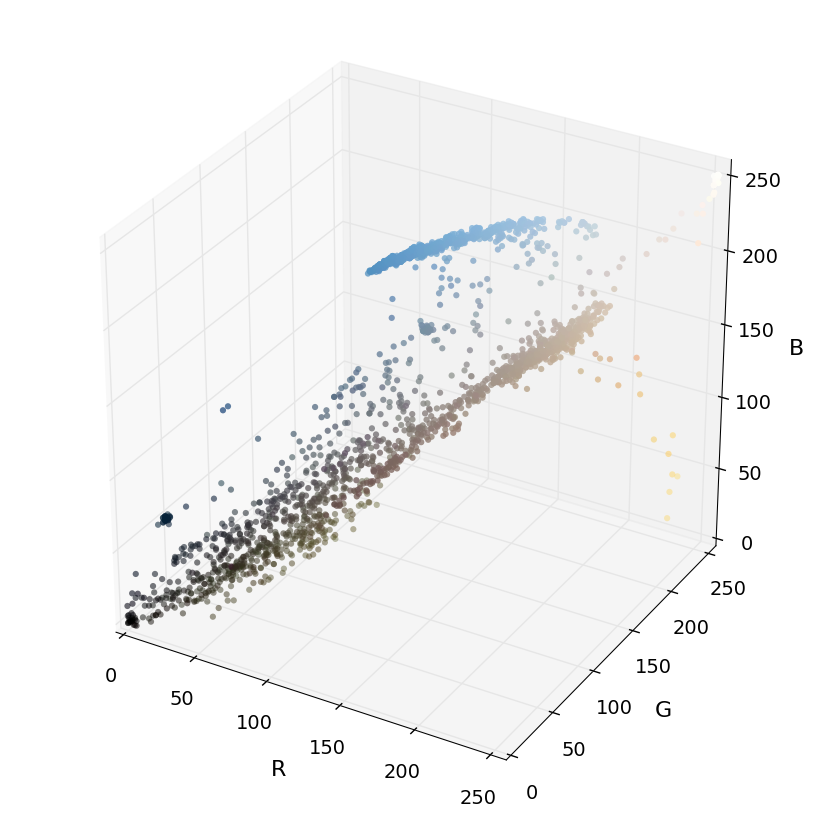

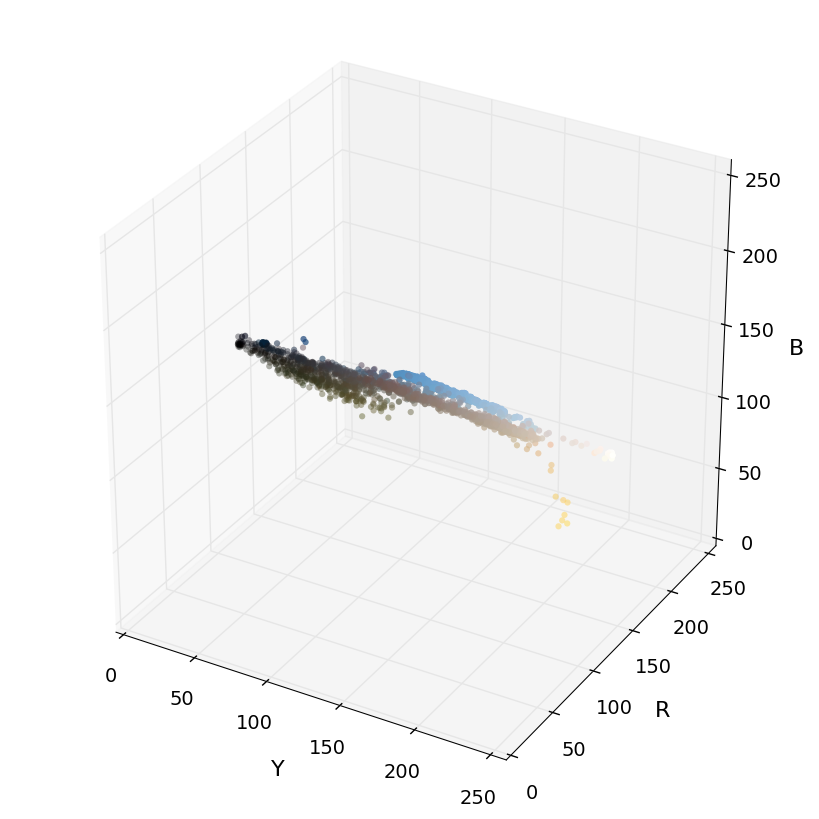

In [243]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot3d(pixels, colors_rgb,
        axis_labels=list("RGB"), axis_limits=[(0, 255), (0, 255), (0, 255)]):
    """Plot pixels in 3D."""

    # Create figure and 3D axes
    fig = plt.figure(figsize=(8, 8))
    ax = Axes3D(fig)

    # Set axis limits
    ax.set_xlim(*axis_limits[0])
    ax.set_ylim(*axis_limits[1])
    ax.set_zlim(*axis_limits[2])

    # Set axis labels and sizes
    ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
    ax.set_xlabel(axis_labels[0], fontsize=16, labelpad=16)
    ax.set_ylabel(axis_labels[1], fontsize=16, labelpad=16)
    ax.set_zlabel(axis_labels[2], fontsize=16, labelpad=16)

    # Plot pixel values with colors given in colors_rgb
    ax.scatter(
        pixels[:, :, 0].ravel(),
        pixels[:, :, 1].ravel(),
        pixels[:, :, 2].ravel(),
        c=colors_rgb.reshape((-1, 3)), edgecolors='none')

    return ax  # return Axes3D object for further manipulation


# Read a color image
img = cv2.imread("./test_images/test1.jpg")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_YCrCb = cv2.cvtColor(img_small, cv2.COLOR_BGR2YCrCb)
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
plot3d(img_small_RGB, img_small_rgb)
plt.show()

plot3d(img_small_YCrCb, img_small_rgb, axis_labels=list("YRB"))
plt.show()


# HOG

In [66]:
# HOG parameters
orient = 9
HOG_ORIENT = 9
pix_per_cell = 8
HOG_PIX_PER_CELL = 8 
cell_per_block =  2
HOG_CELL_PER_BLOCK = 2

# spatial binning
spatial_size = (32,32)
SPATIAL_SIZE = (32,32) 
# color histogram
hist_bins = 32
HIST_BINS = 32

In [246]:
def get_hog_features(ch, orient=HOG_ORIENT, pix_per_cell=HOG_PIX_PER_CELL, cell_per_block=HOG_CELL_PER_BLOCK, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(ch, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(ch, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

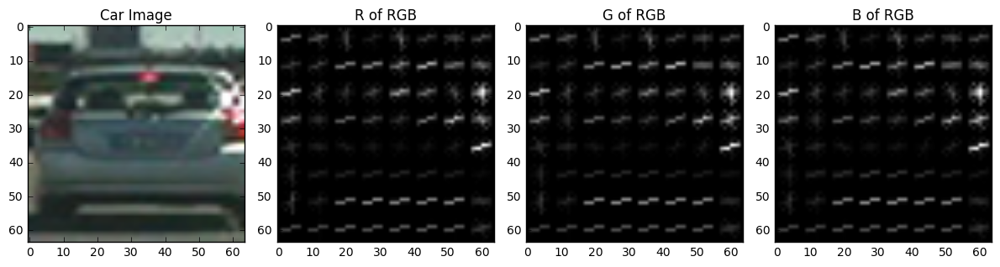

In [247]:
image = mpimg.imread(cars[1981])
features, hog_image_R = get_hog_features(image[:,:,0], HOG_ORIENT, 
                        HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, 
                        vis=True, feature_vec=False)
features, hog_image_G = get_hog_features(image[:,:,1], HOG_ORIENT, 
                        HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, 
                        vis=True, feature_vec=False)
features, hog_image_B = get_hog_features(image[:,:,2], HOG_ORIENT, 
                        HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, 
                        vis=True, feature_vec=False)


# Plot the examples
fig = plt.figure(figsize=(12,4))
plt.subplot(141)
plt.imshow(image)
plt.title('Car Image')

plt.subplot(142)
plt.imshow(hog_image_R, cmap='gray')
plt.title('R of RGB')

plt.subplot(143)
plt.imshow(hog_image_G, cmap='gray')
plt.title('G of RGB')

plt.subplot(144)
plt.imshow(hog_image_B, cmap='gray')
plt.title('B of RGB')
fig.tight_layout()
plt.show()


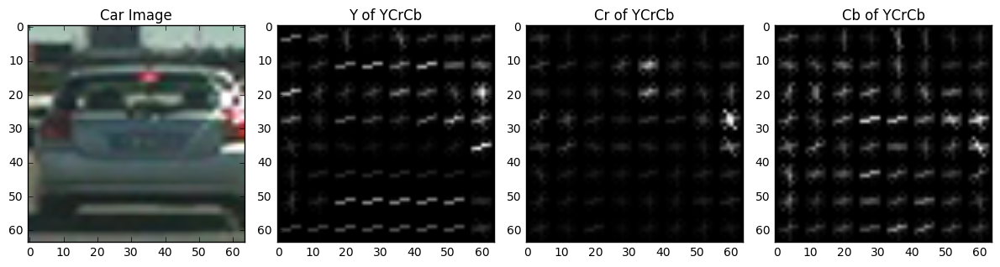

In [245]:
image_RGB = mpimg.imread(cars[1981])
image = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2YCrCb)
features, hog_image_R = get_hog_features(image[:,:,0], HOG_ORIENT, 
                        HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, 
                        vis=True, feature_vec=False)
features, hog_image_G = get_hog_features(image[:,:,1], HOG_ORIENT, 
                        HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, 
                        vis=True, feature_vec=False)
features, hog_image_B = get_hog_features(image[:,:,2], HOG_ORIENT, 
                        HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, 
                        vis=True, feature_vec=False)


# Plot the examples
fig = plt.figure(figsize=(12,4))
plt.subplot(141)
plt.imshow(image_RGB)
plt.title('Car Image')

plt.subplot(142)
plt.imshow(hog_image_R, cmap='gray')
plt.title('Y of YCrCb')

plt.subplot(143)
plt.imshow(hog_image_G, cmap='gray')
plt.title('Cr of YCrCb')

plt.subplot(144)
plt.imshow(hog_image_B, cmap='gray')
plt.title('Cb of YCrCb')
fig.tight_layout()
plt.show()

## Features

In [252]:
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                        
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [253]:
def extractFeatures(fname):
    image_BGR = cv2.imread(fname)
    image_YCrCb = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2YCrCb)
    
    ch1 = image_YCrCb[:,:,0]
    ch2 = image_YCrCb[:,:,1]
    ch3 = image_YCrCb[:,:,2]
    
    hog1 = get_hog_features(ch1, HOG_ORIENT, HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, feature_vec=False).ravel() 
    hog2 = get_hog_features(ch2, HOG_ORIENT, HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, feature_vec=False).ravel() 
    hog3 = get_hog_features(ch3, HOG_ORIENT, HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, feature_vec=False).ravel() 
    hog_features = np.hstack((hog1, hog2, hog3))
    
    spatial_features = bin_spatial(image_YCrCb, size=SPATIAL_SIZE)

    hist_features = color_hist(image_YCrCb, nbins=HIST_BINS)
  
    features = np.hstack((spatial_features, hist_features, hog_features)).ravel()
    
    return features

## Data preparation

In [212]:
cars = []
not_cars = []

cars_images = glob.glob('./vehicles/*')

for folder in cars_images:
    cars += glob.glob('{}/*.png'.format(folder))

not_cars_images = glob.glob('./non-vehicles/*')
for folder in not_cars_images:
    not_cars += glob.glob('{}/*.png'.format(folder))
    
print("Number of car samples:", len(cars))
print("Number of non-car samples", len(not_cars))

In [258]:
def prepareData():

    # Read all the images with car
    images_with_car_fname = []
    subfolders = glob.glob('vehicles/*')
    for folder in subfolders:
        images_with_car_fname += glob.glob(folder + '/*.png')            
      
    
    # Read all the images without car
    images_without_car_fname = []
    subfolders = glob.glob('non-vehicles/*')
    for folder in subfolders:
        images_without_car_fname += glob.glob(folder + '/*.png') 
    
    t1=time.time()
    car_features = []
    for fname in images_with_car_fname:
        car_features.append(extractFeatures(fname))
        
    non_car_features = []
    for fname in images_without_car_fname:
        non_car_features.append(extractFeatures(fname))
    t2=time.time()
    
    # define the labels vector, ordering is cars then non-cars
    labels = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    
    # stack the features together in the same order as the labels
    # transform to np.float64 which is required by StandardScaler
    features = np.vstack((car_features, non_car_features)).astype(np.float64)
    
    # normalize the features
    scaler = StandardScaler().fit(features)
    features = scaler.transform(features)
                      
    print(round(t2-t1, 2), ' seconds to extract features...')
    print("# images with car = ", len(images_with_car_fname))
    print("# images without car = ", len(images_without_car_fname))
    print("feature vector length = ", len(car_features[0]))
    print("# labels = ", len(labels))
    print("# features = ", len(features))
    
    return features, labels, scaler

In [259]:
features, labels, scaler = prepareData()

109.62  seconds to extract features...
# images with car =  8792
# images without car =  8968
feature vector length =  8460
# labels =  17760
# features =  17760


## Training

In [260]:
def train(X, y):
    X, y = shuffle(X, y)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42)
    
    clf = LinearSVC(max_iter=20000)
    clf.fit(X_train, y_train)
    print("Accuracy on test set: ", clf.score(X_test, y_test))
    return clf

clf = train(features, labels)

Accuracy on test set:  0.993524774775


In [262]:
feat = extractFeatures('./writeup_images/non-vehicle-image43.png')
print(clf.predict(feat))

[ 0.]


## Sliding Window

Functions from the course

In [209]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


Region of interest

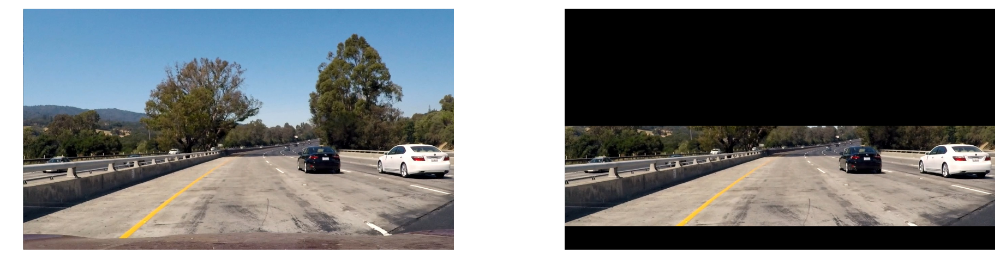

In [248]:
image_BGR = cv2.imread('./test_images/test1.jpg')
image_RGB = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2RGB)
image_RGB_roi = np.copy(image_RGB)
w = image_RGB.shape[1]
h = image_RGB.shape[0]
top = np.array( [[[0,0],[w,0],[w,350],[0,350]]], dtype=np.int32 )
bottom = np.array( [[[0,650],[w,650],[w,h],[0,h]]], dtype=np.int32 )
polys = np.concatenate((top, bottom), axis=0)
cv2.fillPoly(image_RGB_roi, polys, (0,0,0))
fig, ax1 = plt.subplots(1, 2, figsize=(20, 5))
fig.tight_layout()
ax1[0].set_axis_off()
ax1[0].imshow(image_RGB)
ax1[1].set_axis_off()
ax1[1].imshow(image_RGB_roi)
plt.show()

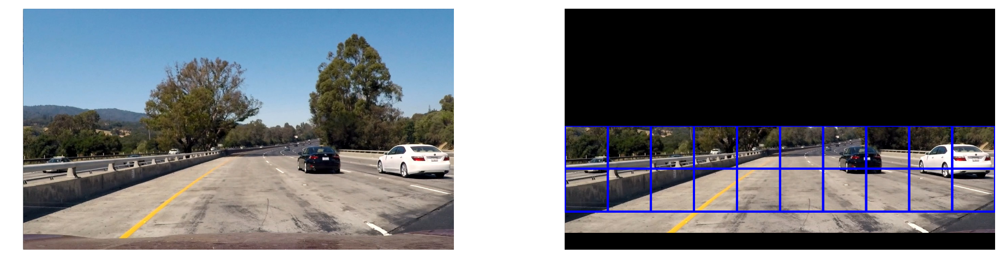

In [10]:
image_BGR = cv2.imread('./test_images/test1.jpg')
image_RGB = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2RGB)
image_RGB_roi = np.copy(image_RGB)

w = image_RGB.shape[1]
h = image_RGB.shape[0]

windows = slide_window(image_RGB_roi, x_start_stop=[0, w], y_start_stop=[350, 670], 
                    xy_window=(128, 128), xy_overlap=(0, 0))
                       
image_RGB_roi = draw_boxes(image_RGB_roi, windows, color=(0, 0, 255), thick=6)   

top = np.array( [[[0,0],[w,0],[w,350],[0,350]]], dtype=np.int32 )
bottom = np.array( [[[0,670],[w,670],[w,h],[0,h]]], dtype=np.int32 )
polys = np.concatenate((top, bottom), axis=0)
cv2.fillPoly(image_RGB_roi, polys, (0,0,0))
fig, ax1 = plt.subplots(1, 2, figsize=(20, 5))
fig.tight_layout()
ax1[0].set_axis_off()
ax1[0].imshow(image_RGB)
ax1[1].set_axis_off()
ax1[1].imshow(image_RGB_roi)
plt.show()

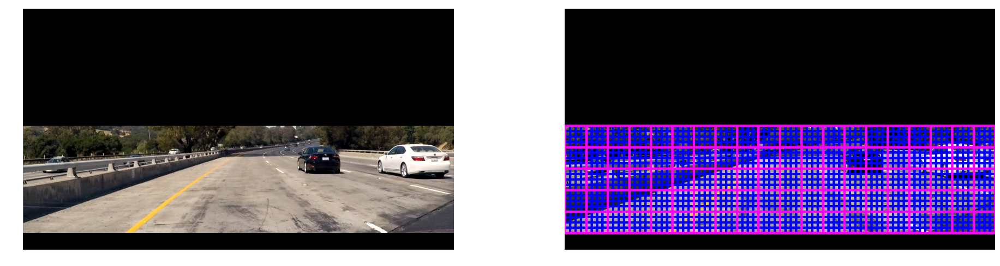

In [264]:
image_BGR = cv2.imread('./test_images/test1.jpg')
image_RGB = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2RGB)
image_RGB_with_overlap = np.copy(image_RGB)
image_RGB_without_overlap = np.copy(image_RGB)

top = np.array( [[[0,0],[w,0],[w,350],[0,350]]], dtype=np.int32 )
bottom = np.array( [[[0,670],[w,670],[w,h],[0,h]]], dtype=np.int32 )
polys = np.concatenate((top, bottom), axis=0)

cv2.fillPoly(image_RGB_without_overlap, polys, (0,0,0))
cv2.fillPoly(image_RGB_with_overlap, polys, (0,0,0))

w = image_RGB.shape[1]
h = image_RGB.shape[0]

windows_with_overlap = slide_window(image_RGB_with_overlap, x_start_stop=[0, w], y_start_stop=[350, 670], 
                    xy_window=(64, 64), xy_overlap=(0.75, 0.75))
                       
image_RGB_with_overlap = draw_boxes(image_RGB_with_overlap, windows_with_overlap, color=(0, 0, 255), thick=6)   

windows_without_overlap = slide_window(image_RGB_without_overlap, x_start_stop=[0, w], y_start_stop=[350, 670], 
                    xy_window=(64, 64), xy_overlap=(0, 0))

image_RGB_with_overlap = draw_boxes(image_RGB_with_overlap, windows_with_overlap, color=(0, 0, 255), thick=6)   
image_RGB_with_overlap = draw_boxes(image_RGB_with_overlap, windows_without_overlap, color=(255, 0, 255), thick=6)

fig, ax1 = plt.subplots(1, 2, figsize=(20, 5))
fig.tight_layout()
ax1[0].set_axis_off()
ax1[0].imshow(image_RGB_without_overlap)
ax1[1].set_axis_off()
ax1[1].imshow(image_RGB_with_overlap)
plt.show()

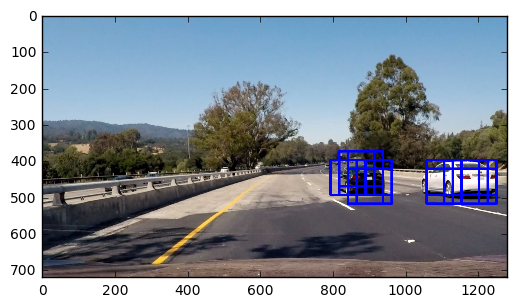

In [265]:
# this is the StandardScaler from the preparation step
scaler = scaler
# this is the classifier from the training
svc = clf

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(image_RGB, ystart, ystop, scale, svc, scaler):
    
    box_list = []

    img_tosearch = image_RGB[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        # if the scale is > 1, meaning the windows are bigger, 
        # then this can be simulated by making, the image smaler but leaving the window as is.
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    hog1 = get_hog_features(ch1, HOG_ORIENT, HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, feature_vec=False)
    hog2 = get_hog_features(ch2, HOG_ORIENT, HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, feature_vec=False)
    hog3 = get_hog_features(ch3, HOG_ORIENT, HOG_PIX_PER_CELL, HOG_CELL_PER_BLOCK, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            xleft = xpos*HOG_PIX_PER_CELL
            ytop = ypos*HOG_PIX_PER_CELL
            
            # Extract the image patch
            subimg = ctrans_tosearch[ytop:ytop+window, xleft:xleft+window]
            spatial_features = bin_spatial(subimg, size=SPATIAL_SIZE)
            hist_features = color_hist(subimg, nbins=HIST_BINS)
            
            feature_list = np.hstack((spatial_features, hist_features, hog_features))

            # Make a prediction on the patch
            test_features = scaler.transform(feature_list.reshape(1,-1))       
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                
                box_list.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return box_list
    
ystart = 350
ystop = 670
scale = 1.5
    
img_RGB = mpimg.imread('./test_images/test4.jpg')
box_list = find_cars(img_RGB, ystart, ystop, scale, svc, scaler)

with_boxes = draw_boxes(img_RBG, box_list)
plt.imshow(with_boxes)
plt.show()

# Heatmap

In [275]:
from scipy.ndimage.measurements import label

class Heatmap:
    
    def __init__(self, threshold=1):
        self.threshold = threshold
        pass
    
    # threshold one means that only pixels which are in more than two bounding boxes make it in the heatmap
    def _apply_threshold(self, heatmap):
        heatmap[heatmap <= self.threshold] = 0
        return heatmap
    
    def create_heatmap(self, image_BGR, bbox_list):
        heat = np.zeros_like(image_BGR[:,:,0]).astype(np.float)

        for box in bbox_list:
            #print(box)
            # Add += 1 for all pixels inside each bbox
            # Assuming each "box" takes the form ((x1, y1), (x2, y2))
            heat[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
        
        heat = self._apply_threshold(heat)
        heat = np.clip(heat, 0, 255)
        return heat
    
    def get_bounding_boxes(self, heatmap):
        bbox_list = []
        labels = label(heatmap)
        #print(labels[1])
        number_of_areas = labels[1]
        for car_number in range(1, number_of_areas + 1):
            # Find pixels with each car_number label value
            nonzero = (labels[0] == car_number).nonzero()
            # Identify x and y values of those pixels
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            # Define a bounding box based on min/max x and y
            bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
            bbox_list.append(bbox)
         
        return bbox_list

2


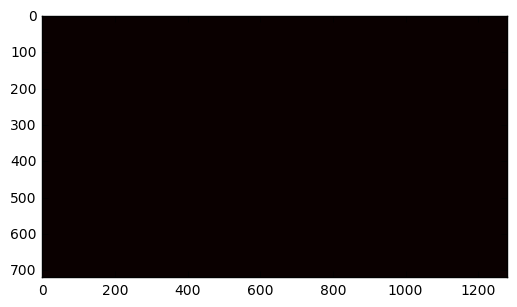

In [276]:
img_BGR = cv2.imread('./test_images/test4.jpg')
h = Heatmap()
heat = h.create_heatmap(img_BGR, box_list)
print(len(box_list))
plt.imshow(heat, cmap='hot')
plt.show()

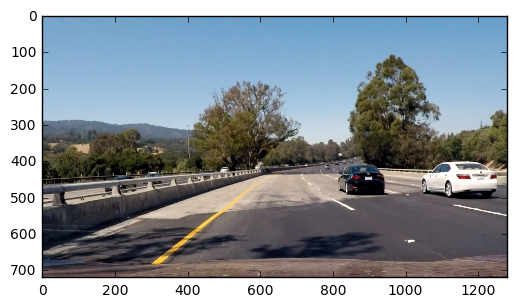

In [277]:
box_list = h.get_bounding_boxes(heat)
with_boxes = draw_boxes(img_RGB, box_list)
plt.imshow(with_boxes)
plt.show()

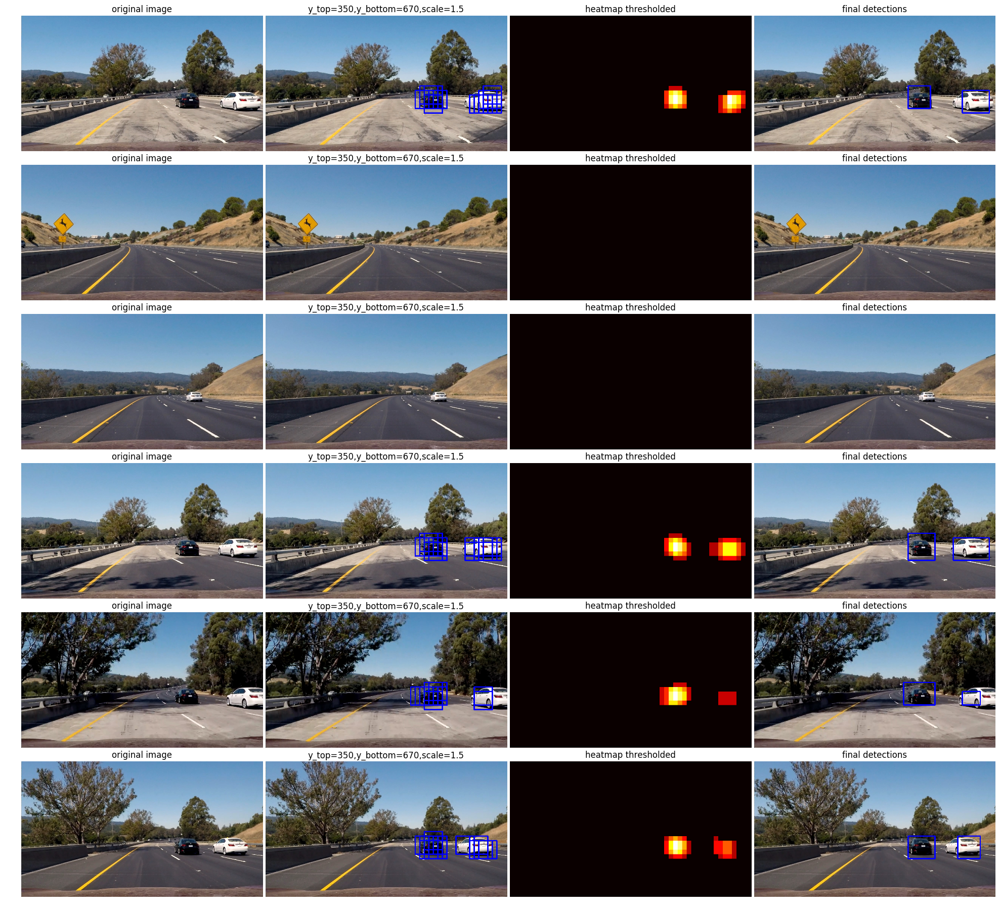

In [280]:
def visualizePipeline(ax, fname):
    image_RGB = mpimg.imread(fname)
    ax[0].set_axis_off()    
    ax[0].imshow(image_RGB)
    ax[0].set_title("original image")

    ystart = 350
    ystop = 670
    scale = 1.5
    box_list = find_cars(image_RGB, ystart, ystop, scale, svc, scaler)
    boxes = draw_boxes(np.copy(image_RGB), box_list)
    ax[1].set_axis_off()    
    ax[1].imshow(boxes)
    ax[1].set_title("y_top=350,y_bottom=670,scale=1.5")
    
    h = Heatmap()
    heat = h.create_heatmap(image_RGB, box_list)
    ax[2].set_axis_off()    
    ax[2].imshow(heat, cmap='hot')
    ax[2].set_title("heatmap thresholded")
    
    box_list = h.get_bounding_boxes(heat)
    labels = draw_boxes(np.copy(image_RGB), box_list)
    ax[3].set_axis_off()    
    ax[3].imshow(labels)
    ax[3].set_title("final detections")
    
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 4, figsize=(20, 18))
fig.tight_layout()
visualizePipeline(ax1, './test_images/test1.jpg')
visualizePipeline(ax2, './test_images/test2.jpg')
visualizePipeline(ax3, './test_images/test3.jpg')
visualizePipeline(ax4, './test_images/test4.jpg')
visualizePipeline(ax5, './test_images/test5.jpg')
visualizePipeline(ax6, './test_images/test6.jpg')
plt.subplots_adjust(wspace=0, hspace=0.1)
plt.show()

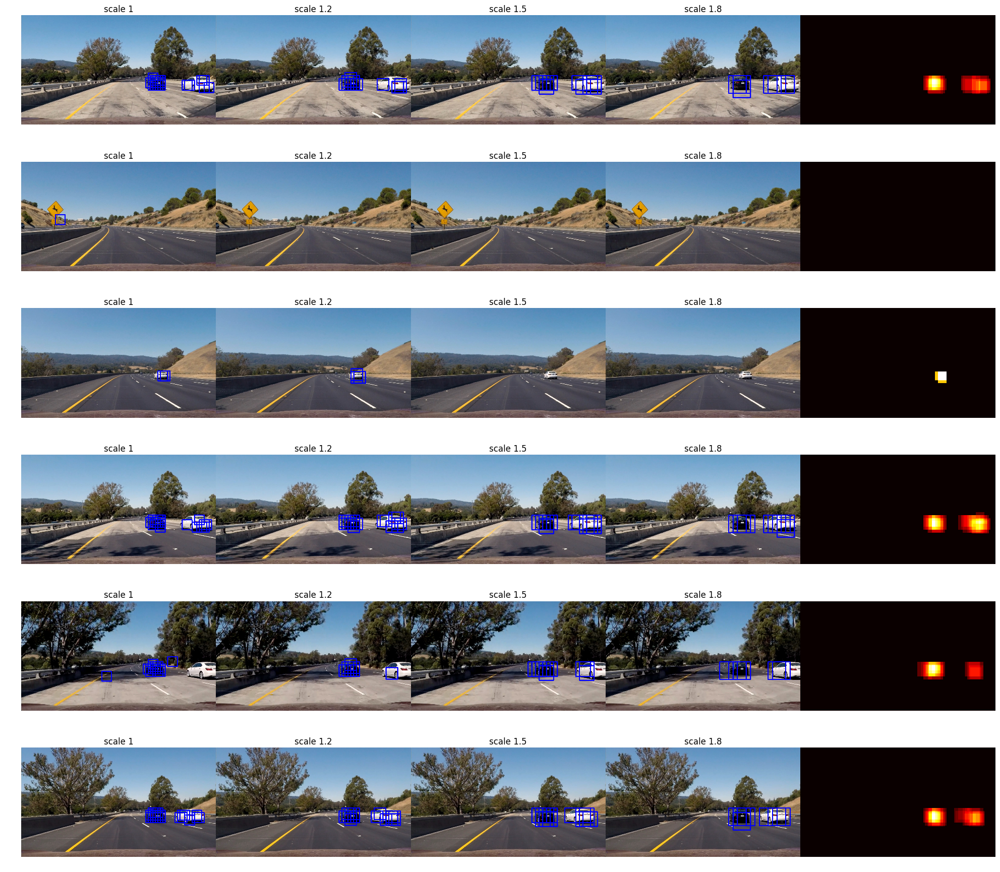

In [283]:
def visualizeDifferentScales(ax, fname):
    t1=time.time()               
    image_RGB = mpimg.imread(fname)
    t2=time.time()     
    #print(round(t2-t1, 2), ' seconds for color convert')
    
    t1=time.time() 
    ystart = 350
    ystop = 550
    box_list_2 = find_cars(image_RGB, ystart, ystop, 1, svc, scaler)
    boxes = draw_boxes(np.copy(image_RGB), box_list_2)
    ax[0].set_axis_off()    
    ax[0].imshow(boxes)
    ax[0].set_title("scale 1")
    t2=time.time()    
    #print("Scale 1", len(box_list_2))
    #print(round(t2-t1, 2), ' seconds for scale 1')
    
    t1=time.time() 
    ystart = 380
    ystop = 550
    box_list_3 = find_cars(image_RGB, ystart, ystop, 1.2, svc, scaler)
    boxes = draw_boxes(np.copy(image_RGB), box_list_3)
    ax[1].set_axis_off()    
    ax[1].imshow(boxes)
    ax[1].set_title("scale 1.2")
    t2=time.time()    
    #print("Scale 1.2", len(box_list_3))
    #print(round(t2-t1, 2), ' seconds for scale 1.2')
    
    t1=time.time() 
    ystart = 400
    ystop = 550
    box_list_1 = find_cars(image_RGB, ystart, ystop, 1.5, svc, scaler)
    boxes = draw_boxes(np.copy(image_RGB), box_list_1)
    ax[2].set_axis_off()    
    ax[2].imshow(boxes)
    ax[2].set_title("scale 1.5")
    t2=time.time()     
    #print("Scale 1.5", len(box_list_1))
    #print(round(t2-t1, 2), ' seconds for scale 1.5')
    
    t1=time.time() 
    ystart = 400
    ystop = 600
    box_list_4 = find_cars(image_RGB, ystart, ystop, 1.8, svc, scaler)
    boxes = draw_boxes(np.copy(image_RGB),box_list_4)
    ax[3].set_axis_off()    
    ax[3].imshow(boxes)
    ax[3].set_title("scale 1.8")
    t2=time.time()    
    #print("Scale 1.8", len(box_list_4))
    #print(round(t2-t1, 2), ' seconds for scale 1.8')
    
    t1=time.time()
    all_boxes = box_list_1 + box_list_3 + box_list_4
    h = Heatmap()
    heat = h.create_heatmap(image_RGB, all_boxes)
    h.get_bounding_boxes(heat)
    labels = draw_boxes(np.copy(image_RGB), all_boxes)
    ax[4].set_axis_off()    
    ax[4].imshow(heat, cmap='hot')
    #print(round(t2-t1, 2), ' seconds for heatmap')
    
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 5, figsize=(20, 18))
fig.tight_layout()
visualizeDifferentScales(ax1, './test_images/test1.jpg')
visualizeDifferentScales(ax2, './test_images/test2.jpg')
visualizeDifferentScales(ax3, './test_images/test3.jpg')
visualizeDifferentScales(ax4, './test_images/test4.jpg')
visualizeDifferentScales(ax5, './test_images/test5.jpg')
visualizeDifferentScales(ax6, './test_images/test6.jpg')
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [285]:
def image_pipeline(image_RGB):
    
    ystart = 380
    ystop = 550
    box_list_1 = find_cars(image_RGB, ystart, ystop, 1.2, svc, scaler)
   
    ystart = 400
    ystop = 550
    box_list_2 = find_cars(image_RGB, ystart, ystop, 1.5, svc, scaler)
    
    ystart = 400
    ystop = 600
    box_list_3 = find_cars(image_RGB, ystart, ystop, 1.8, svc, scaler)
    
    all_boxes = box_list_1 + box_list_2 + box_list_3
    h = Heatmap()
    heat = h.create_heatmap(image_RGB, all_boxes)
    labels = h.get_bounding_boxes(heat)
    output = draw_boxes(np.copy(image_RGB), labels)
    
    return output
    
    

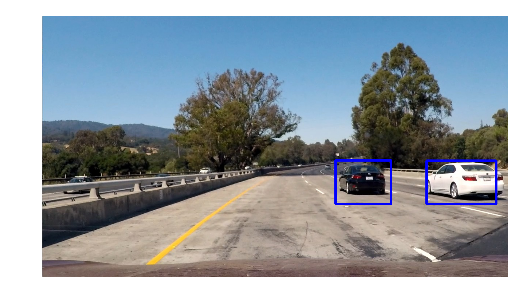

In [286]:
img_BGR = mpimg.imread('./test_images/test4.jpg')
output = image_pipeline(image_RGB)
plt.imshow(output)
plt.axis('off')


plt.show()

In [298]:
def image_pipeline_context_aware(image_RGB):
    
    ystart = 380
    ystop = 550
    box_list_1 = find_cars(image_RGB, ystart, ystop, 1.2, svc, scaler)
   
    ystart = 400
    ystop = 550
    box_list_2 = find_cars(image_RGB, ystart, ystop, 1.5, svc, scaler)
    
    ystart = 400
    ystop = 600
    box_list_3 = find_cars(image_RGB, ystart, ystop, 1.8, svc, scaler)
    
    all_boxes = box_list_1 + box_list_2 + box_list_3
    d.append(all_boxes)

    result = []
    for lst in d:
        result.extend(lst[:])
        
    h = Heatmap(5)
    heat = h.create_heatmap(image_RGB, result)
    labels = h.get_bounding_boxes(heat)
    output = draw_boxes(np.copy(image_RGB), labels)
    
    return output

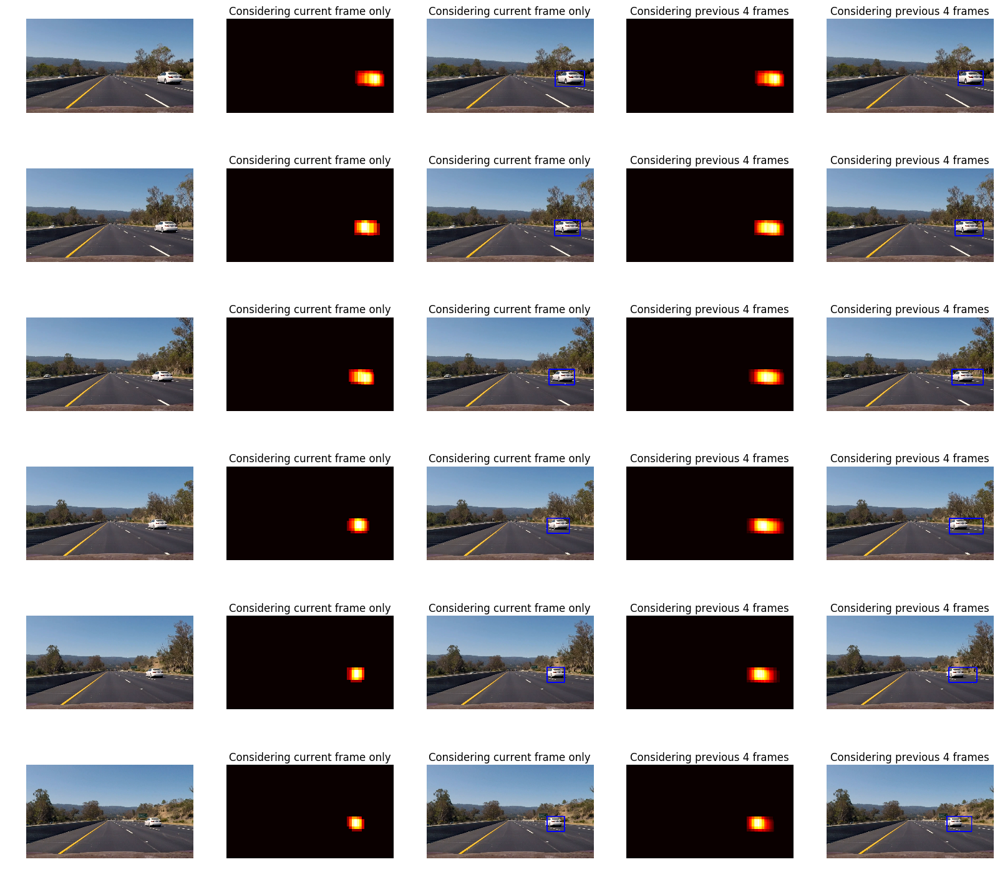

In [300]:
def visualize_frame_sequence(ax, frame_idx, clip):
    ax[0].set_axis_off() 
    frame = clip.get_frame(frame_idx)
    ax[0].imshow(frame)
    
    ystart = 380
    ystop = 550
    box_list_1 = find_cars(frame, ystart, ystop, 1.2, svc, scaler)
   
    ystart = 400
    ystop = 550
    box_list_2 = find_cars(frame, ystart, ystop, 1.5, svc, scaler)
    
    ystart = 400
    ystop = 600
    box_list_3 = find_cars(frame, ystart, ystop, 1.8, svc, scaler)
    
    all_boxes = box_list_1 + box_list_2 + box_list_3
    heat = h.create_heatmap(frame, all_boxes)
    ax[1].set_axis_off()    
    ax[1].set_title("Considering current frame only")
    ax[1].imshow(heat, cmap='hot')
    
    ax[2].set_axis_off() 
    ax[2].set_title("Considering current frame only")
    ax[2].imshow(image_pipeline(frame))
    
    ax[4].set_axis_off() 
    ax[4].set_title("Considering previous 4 frames")
    ax[4].imshow(image_pipeline_context_aware(frame))

    # d is updated when image_pipeline_context_aware runs,
    # so the heatmap can be visualized after that only
    result = []
    for lst in d:
        result.extend(lst[:])
    
    heat = h.create_heatmap(frame, result)
    ax[3].set_axis_off()    
    ax[3].set_title("Considering previous 4 frames")
    ax[3].imshow(heat, cmap='hot')
    
d = deque([], maxlen=4)
clip = VideoFileClip("project_video.mp4")
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 5, figsize=(20, 18))
visualize_frame_sequence(ax1, 13, clip)
visualize_frame_sequence(ax2, 14, clip)
visualize_frame_sequence(ax3, 15, clip)
visualize_frame_sequence(ax4, 16, clip)
visualize_frame_sequence(ax5, 17, clip)
visualize_frame_sequence(ax6, 18, clip)
plt.show()

## Video Pipeline

In [205]:
clip = VideoFileClip("project_video.mp4")
output_video_file ="project_video_sven_7.mp4"
 
#ip = ImagePipeline(camera)
t_start = 0.0
t_end = 0.0

if t_end > 0.0:
    clip = clip.subclip(t_start=t_start, t_end=t_end)
else:
    clip = clip.subclip(t_start=t_start)
    
#framez = clip.get_frame(13)
#framez = cv2.cvtColor(framez, cv2.COLOR_RGB2BGR)
#cv2.imwrite("challenge_video-13.jpg", framez)
#processed = ip.run(framez)
#showImagesSideBySide_BGR_BGR(framez, processed)

#this will pass an RGB image to the function image_pipeline
d = deque([], maxlen=4)
clip = clip.fl_image(image_pipeline_context_aware)
clip.write_videofile(output_video_file, audio=False)

[MoviePy] >>>> Building video project_video_sven_7.mp4
[MoviePy] Writing video project_video_sven_7.mp4


100%|█████████▉| 1260/1261 [15:29<00:00,  1.30it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_sven_7.mp4 



In [ ]:
arr = [1,2,3]
nparr = np.array(arr)
print(nparr)
print(nparr.shape)
nparr =nparr.reshape(1,-1)
print(nparr)
print(nparr.shape)
nparr_stacked = np.vstack((nparr,nparr))
print(nparr_stacked)
print(nparr_stacked.shape)